In [1]:
import pandas as pd

# Path ke dua file CSV yang berbeda
path_main = "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\"
file = path_main + "labels.csv"
df = pd.read_csv(file)
df.head()

,file_path,width,height,label
0,ba\002798ad-631c-4f0c-b899-aa66fb5c2ac1.png,239,167,ba
1,ba\040ab1c7-bffa-4a93-8c42-54e5597f2243.png,96,67,ba
2,ba\0789a0d8-e129-48ec-b74e-2e53f4a7ece9.png,235,166,ba
3,ba\11f6c317-635a-4e64-8552-05bf8b7b3a95.png,96,67,ba
4,ba\13469389-6f9b-43dc-be99-8dfbfaae51cb.png,235,165,ba


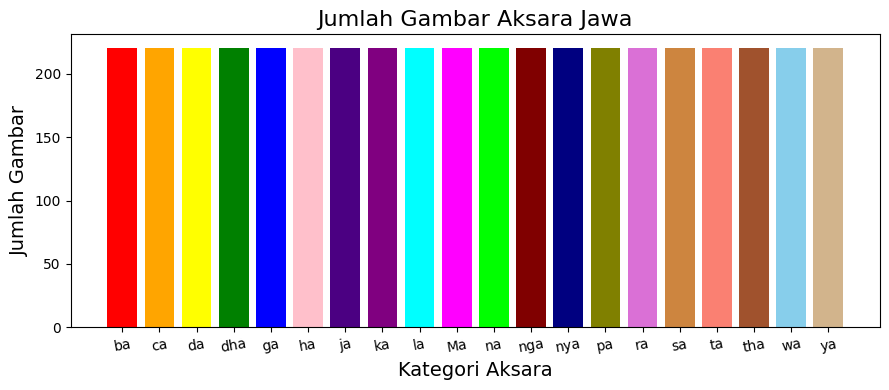

In [2]:
import matplotlib.pyplot as plt
import os

# Define function to count files in each directory
def count_files(link):
    path = link
    num_files = len([f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))])
    return num_files

# Define paths for two sources
source_paths = [
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ba",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ca",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\da",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\dha",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ga",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ha",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ja",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ka",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\la",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ma",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\na",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\nga",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\nya",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\pa",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ra",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\sa",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ta",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\tha",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\wa",
    "C:\\Users\\wawn1\\projects_skripsi\\data\\data_preprocessing\\v3.4_data_custom\\ya"
]

# Count files for each path
file_counts = [count_files(path) for path in source_paths]

# Define the input path aksara
aksara_categories = ['ba', 'ca', 'da', 'dha', 'ga', 'ha', 'ja', 'ka', 'la', 'Ma', 'na',
                     'nga', 'nya', 'pa', 'ra', 'sa', 'ta', 'tha', 'wa', 'ya']

colors = ['red', 'orange', 'yellow', 'green', 'blue', 'pink', 'indigo', 'purple', 
          'cyan', 'magenta', 'lime', 'maroon', 'navy', 'olive', 'orchid', 'peru', 
          'salmon', 'sienna', 'skyblue', 'tan']  # Colors for each bar

# Create bar chart
plt.figure(figsize=(9, 4))
plt.bar(aksara_categories, file_counts, color=colors)
plt.xlabel('Kategori Aksara', fontsize=14)
plt.ylabel('Jumlah Gambar', fontsize=14)
plt.title('Jumlah Gambar Aksara Jawa', fontsize=16)
plt.xticks(fontsize=10, rotation=10)
plt.tight_layout()

# Show the plot
plt.show()

# Apply Gaussian Blur + Enhance the image sharpness + Apply sharpening filter

In [39]:
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

# Define the input path and aksaraJowo
INPUT_PATH = path_main  
AKSARA = aksara_categories

# Define the target image size
IMAGE_SIZE = (100, 100)
INPUT_SHAPE = (100, 100, 1)

def create_image_generator(input_path, aksaraJowo, image_size):
    for index, jowo in enumerate(aksaraJowo):
        aksara_path = os.path.join(input_path, jowo)
        
        for filename in os.listdir(aksara_path):
            image_path = os.path.join(aksara_path, filename)
            original_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)  # Baca dan ubah warna asli
            original_image_resized = cv2.resize(original_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar asli
            grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Baca gambar sebagai grayscale
            grayscale_image_resized = cv2.resize(grayscale_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar grayscale
            image_filtered = apply_custom_preprocessing(grayscale_image_resized)
            
            yield original_image_resized, grayscale_image_resized, image_filtered, index


def load_images(input_path, aksaraJowo, image_size):
    X_original, X_grayscale, X_filtered, y_label = [], [], [], []
    
    for original_image, grayscale_image, image_filtered, label in create_image_generator(input_path, aksaraJowo, image_size):
        X_original.append(original_image)
        X_grayscale.append(grayscale_image)
        X_filtered.append(image_filtered)
        y_label.append(label)
        
    X_original = np.array(X_original)
    X_grayscale = np.array(X_grayscale)
    X_filtered = np.array(X_filtered)
    y_label = to_categorical(np.array(y_label))
    
    return X_original, X_grayscale, X_filtered, y_label

def apply_custom_preprocessing(image):
    # Apply Gaussian Blur
    ApplyGaussian = cv2.GaussianBlur(image, (9, 9), 0.1)
    # Enhance the image sharpness
    img = cv2.addWeighted(image, 1.5, ApplyGaussian, -0.5, 0, image)
    # Apply sharpening filter
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    img = cv2.filter2D(img, -1, kernel)
    # Remove noise using median filter
    # img = cv2.medianBlur(img, 1)
    # Apply Otsu's thresholding
    # _, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert the image (background to black, text to white)
    # img = 255 - img
    
    return img

# Load images with custom preprocessing applied
X_original, X_grayscale, X_filtered, y_label = load_images(INPUT_PATH, AKSARA, IMAGE_SIZE)

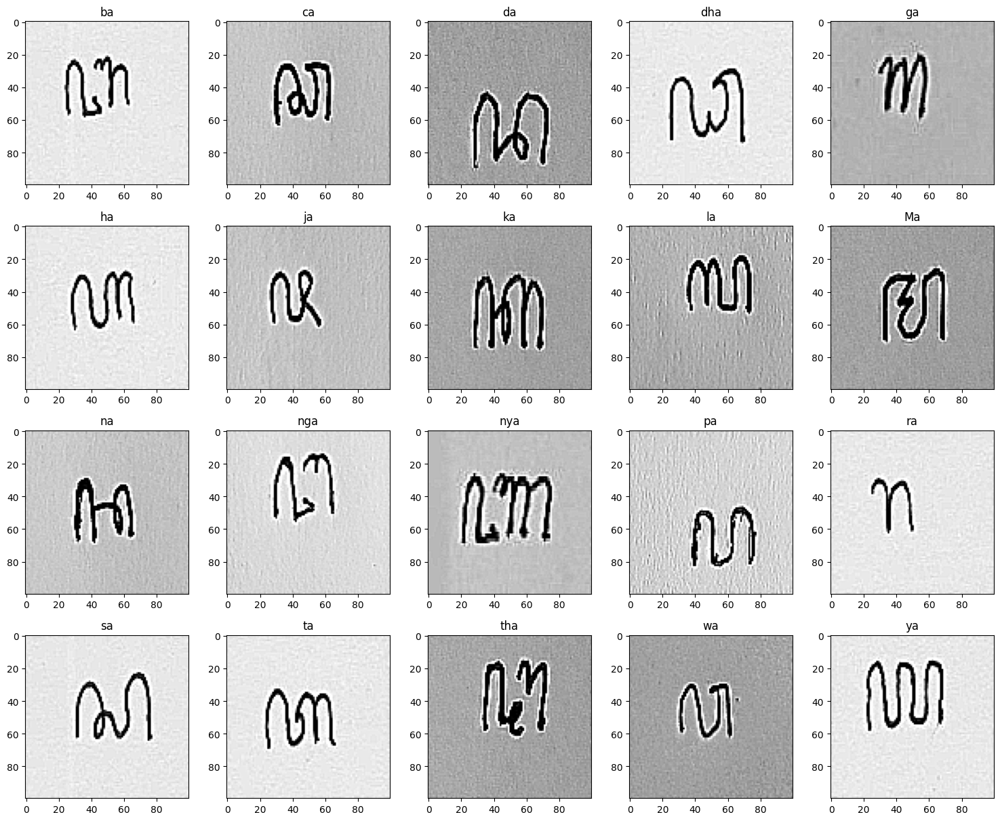

In [41]:
import matplotlib.pyplot as plt
import numpy as np

def display_one_image_per_class(images, labels, class_labels):
    unique_labels = np.unique(labels)
    
    plt.figure(figsize=(15, 15))
    
    # Calculate grid size
    num_classes = len(unique_labels)
    grid_size = int(np.ceil(np.sqrt(num_classes)))
    
    for i, label in enumerate(unique_labels):
        # Get indices of images for the current class
        class_indices = np.where(labels == label)[0]
        
        # Select the first image (or you can use random.choice to select one randomly)
        class_image = images[class_indices[0]]
        class_title = class_labels[label]
        
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(class_image, cmap='gray')
        plt.title(class_title)
        plt.axis('on')
    
    plt.tight_layout()
    plt.show()

# Assuming AKSARA contains the label names corresponding to each category index
class_labels = {i: aksara for i, aksara in enumerate(AKSARA)}

# Display one image per class with labels
display_one_image_per_class(X_filtered, np.argmax(y_label, axis=1), class_labels)

# Apply Gaussian Blur + Enhance the image sharpness + Apply sharpening filter + Remove noise using median filter

In [42]:
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

# Define the input path and aksaraJowo
INPUT_PATH = path_main  
AKSARA = aksara_categories

# Define the target image size
IMAGE_SIZE = (100, 100)
INPUT_SHAPE = (100, 100, 1)

def create_image_generator(input_path, aksaraJowo, image_size):
    for index, jowo in enumerate(aksaraJowo):
        aksara_path = os.path.join(input_path, jowo)
        
        for filename in os.listdir(aksara_path):
            image_path = os.path.join(aksara_path, filename)
            original_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)  # Baca dan ubah warna asli
            original_image_resized = cv2.resize(original_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar asli
            grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Baca gambar sebagai grayscale
            grayscale_image_resized = cv2.resize(grayscale_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar grayscale
            image_filtered = apply_custom_preprocessing(grayscale_image_resized)
            
            yield original_image_resized, grayscale_image_resized, image_filtered, index


def load_images(input_path, aksaraJowo, image_size):
    X_original, X_grayscale, X_filtered, y_label = [], [], [], []
    
    for original_image, grayscale_image, image_filtered, label in create_image_generator(input_path, aksaraJowo, image_size):
        X_original.append(original_image)
        X_grayscale.append(grayscale_image)
        X_filtered.append(image_filtered)
        y_label.append(label)
        
    X_original = np.array(X_original)
    X_grayscale = np.array(X_grayscale)
    X_filtered = np.array(X_filtered)
    y_label = to_categorical(np.array(y_label))
    
    return X_original, X_grayscale, X_filtered, y_label

def apply_custom_preprocessing(image):
    # Apply Gaussian Blur
    ApplyGaussian = cv2.GaussianBlur(image, (9, 9), 0.1)
    # Enhance the image sharpness
    img = cv2.addWeighted(image, 1.5, ApplyGaussian, -0.5, 0, image)
    # Apply sharpening filter
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    img = cv2.filter2D(img, -1, kernel)
    # Remove noise using median filter
    img = cv2.medianBlur(img, 1)
    # Apply Otsu's thresholding
    # _, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert the image (background to black, text to white)
    # img = 255 - img
    
    return img

# Load images with custom preprocessing applied
X_original, X_grayscale, X_filtered, y_label = load_images(INPUT_PATH, AKSARA, IMAGE_SIZE)

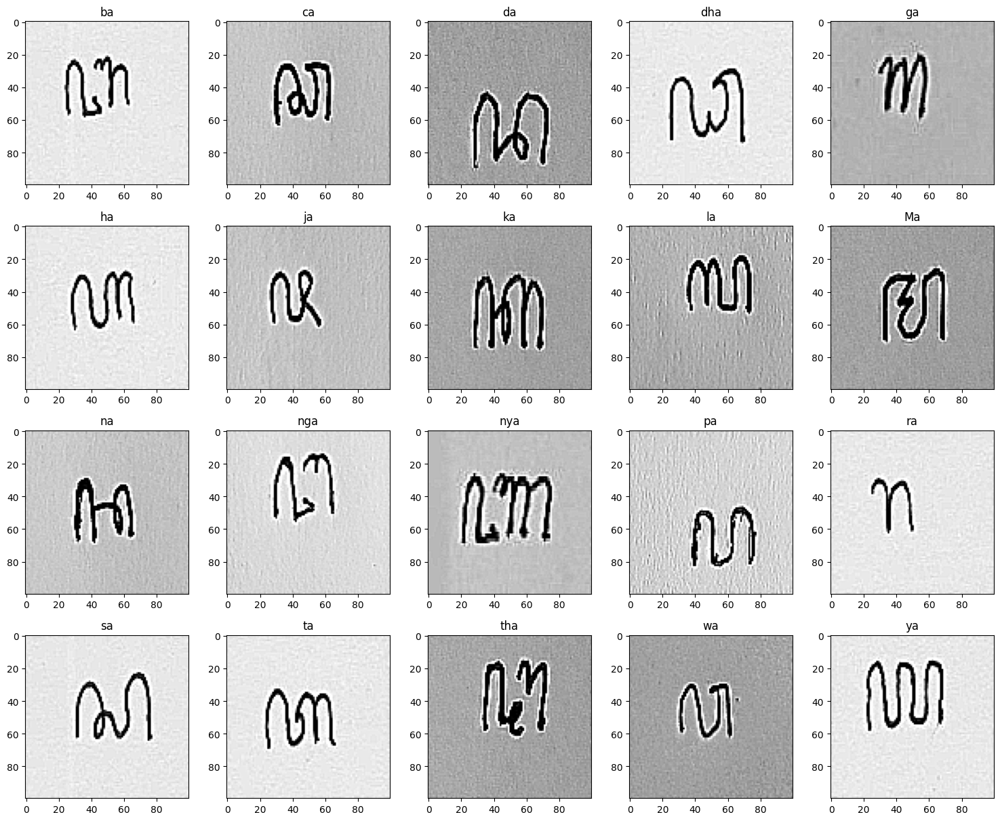

In [43]:
import matplotlib.pyplot as plt
import numpy as np

def display_one_image_per_class(images, labels, class_labels):
    unique_labels = np.unique(labels)
    
    plt.figure(figsize=(15, 15))
    
    # Calculate grid size
    num_classes = len(unique_labels)
    grid_size = int(np.ceil(np.sqrt(num_classes)))
    
    for i, label in enumerate(unique_labels):
        # Get indices of images for the current class
        class_indices = np.where(labels == label)[0]
        
        # Select the first image (or you can use random.choice to select one randomly)
        class_image = images[class_indices[0]]
        class_title = class_labels[label]
        
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(class_image, cmap='gray')
        plt.title(class_title)
        plt.axis('on')
    
    plt.tight_layout()
    plt.show()

# Assuming AKSARA contains the label names corresponding to each category index
class_labels = {i: aksara for i, aksara in enumerate(AKSARA)}

# Display one image per class with labels
display_one_image_per_class(X_filtered, np.argmax(y_label, axis=1), class_labels)

# Apply Gaussian Blur + Enhance the image sharpness + Apply sharpening filter + Remove noise using median filter + Otsu's thresholding

In [44]:
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

# Define the input path and aksaraJowo
INPUT_PATH = path_main  
AKSARA = aksara_categories

# Define the target image size
IMAGE_SIZE = (100, 100)
INPUT_SHAPE = (100, 100, 1)

def create_image_generator(input_path, aksaraJowo, image_size):
    for index, jowo in enumerate(aksaraJowo):
        aksara_path = os.path.join(input_path, jowo)
        
        for filename in os.listdir(aksara_path):
            image_path = os.path.join(aksara_path, filename)
            original_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)  # Baca dan ubah warna asli
            original_image_resized = cv2.resize(original_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar asli
            grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Baca gambar sebagai grayscale
            grayscale_image_resized = cv2.resize(grayscale_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar grayscale
            image_filtered = apply_custom_preprocessing(grayscale_image_resized)
            
            yield original_image_resized, grayscale_image_resized, image_filtered, index


def load_images(input_path, aksaraJowo, image_size):
    X_original, X_grayscale, X_filtered, y_label = [], [], [], []
    
    for original_image, grayscale_image, image_filtered, label in create_image_generator(input_path, aksaraJowo, image_size):
        X_original.append(original_image)
        X_grayscale.append(grayscale_image)
        X_filtered.append(image_filtered)
        y_label.append(label)
        
    X_original = np.array(X_original)
    X_grayscale = np.array(X_grayscale)
    X_filtered = np.array(X_filtered)
    y_label = to_categorical(np.array(y_label))
    
    return X_original, X_grayscale, X_filtered, y_label

def apply_custom_preprocessing(image):
    # Apply Gaussian Blur
    ApplyGaussian = cv2.GaussianBlur(image, (9, 9), 0.1)
    # Enhance the image sharpness
    img = cv2.addWeighted(image, 1.5, ApplyGaussian, -0.5, 0, image)
    # Apply sharpening filter
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    img = cv2.filter2D(img, -1, kernel)
    # Remove noise using median filter
    img = cv2.medianBlur(img, 1)
    # Apply Otsu's thresholding
    _, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert the image (background to black, text to white)
    # img = 255 - img
    
    return img

# Load images with custom preprocessing applied
X_original, X_grayscale, X_filtered, y_label = load_images(INPUT_PATH, AKSARA, IMAGE_SIZE)

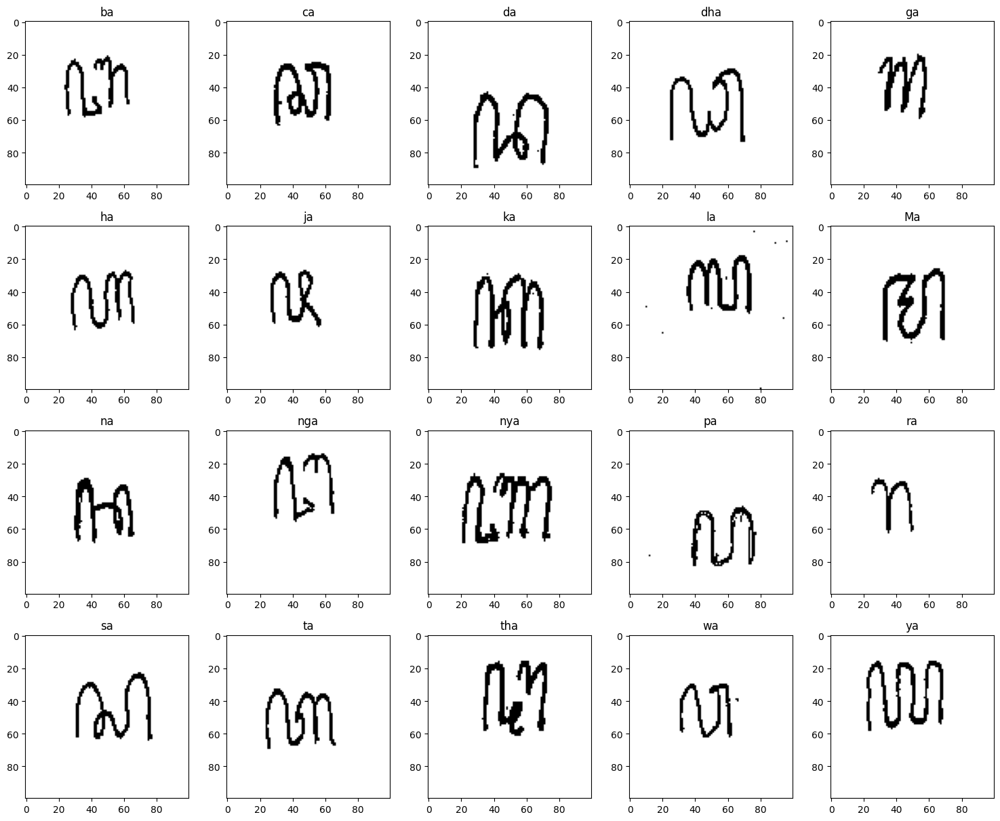

In [45]:
import matplotlib.pyplot as plt
import numpy as np

def display_one_image_per_class(images, labels, class_labels):
    unique_labels = np.unique(labels)
    
    plt.figure(figsize=(15, 15))
    
    # Calculate grid size
    num_classes = len(unique_labels)
    grid_size = int(np.ceil(np.sqrt(num_classes)))
    
    for i, label in enumerate(unique_labels):
        # Get indices of images for the current class
        class_indices = np.where(labels == label)[0]
        
        # Select the first image (or you can use random.choice to select one randomly)
        class_image = images[class_indices[0]]
        class_title = class_labels[label]
        
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(class_image, cmap='gray')
        plt.title(class_title)
        plt.axis('on')
    
    plt.tight_layout()
    plt.show()

# Assuming AKSARA contains the label names corresponding to each category index
class_labels = {i: aksara for i, aksara in enumerate(AKSARA)}

# Display one image per class with labels
display_one_image_per_class(X_filtered, np.argmax(y_label, axis=1), class_labels)

# Apply Gaussian Blur + Enhance the image sharpness + Apply sharpening filter + Remove noise using median filter + Otsu's thresholding + Invert the image

In [46]:
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

# Define the input path and aksaraJowo
INPUT_PATH = path_main  
AKSARA = aksara_categories

# Define the target image size
IMAGE_SIZE = (100, 100)
INPUT_SHAPE = (100, 100, 1)

def create_image_generator(input_path, aksaraJowo, image_size):
    for index, jowo in enumerate(aksaraJowo):
        aksara_path = os.path.join(input_path, jowo)
        
        for filename in os.listdir(aksara_path):
            image_path = os.path.join(aksara_path, filename)
            original_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)  # Baca dan ubah warna asli
            original_image_resized = cv2.resize(original_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar asli
            grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Baca gambar sebagai grayscale
            grayscale_image_resized = cv2.resize(grayscale_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar grayscale
            image_filtered = apply_custom_preprocessing(grayscale_image_resized)
            
            yield original_image_resized, grayscale_image_resized, image_filtered, index


def load_images(input_path, aksaraJowo, image_size):
    X_original, X_grayscale, X_filtered, y_label = [], [], [], []
    
    for original_image, grayscale_image, image_filtered, label in create_image_generator(input_path, aksaraJowo, image_size):
        X_original.append(original_image)
        X_grayscale.append(grayscale_image)
        X_filtered.append(image_filtered)
        y_label.append(label)
        
    X_original = np.array(X_original)
    X_grayscale = np.array(X_grayscale)
    X_filtered = np.array(X_filtered)
    y_label = to_categorical(np.array(y_label))
    
    return X_original, X_grayscale, X_filtered, y_label

def apply_custom_preprocessing(image):
    # Apply Gaussian Blur
    ApplyGaussian = cv2.GaussianBlur(image, (9, 9), 0.1)
    # Enhance the image sharpness
    img = cv2.addWeighted(image, 1.5, ApplyGaussian, -0.5, 0, image)
    # Apply sharpening filter
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    img = cv2.filter2D(img, -1, kernel)
    # Remove noise using median filter
    img = cv2.medianBlur(img, 1)
    # Apply Otsu's thresholding
    _, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert the image (background to black, text to white)
    img = 255 - img
    
    return img

# Load images with custom preprocessing applied
X_original, X_grayscale, X_filtered, y_label = load_images(INPUT_PATH, AKSARA, IMAGE_SIZE)

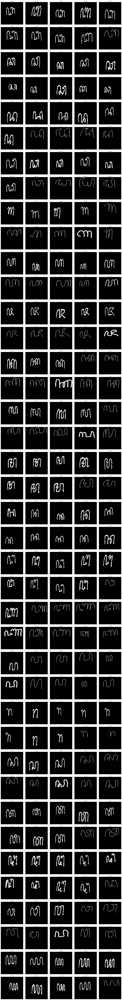

In [47]:
import matplotlib.pyplot as plt
import numpy as np

def display_images_per_class(images, labels, class_labels, num_per_class, num_cols=5):
    unique_labels = np.unique(labels)
    num_classes = len(unique_labels)
    
    # Calculate number of rows needed
    num_rows = (num_classes * num_per_class + num_cols - 1) // num_cols

    plt.figure(figsize=(num_cols * 3, num_rows * 3))  # Adjust figure size
    
    for i, label in enumerate(unique_labels):
        # Get indices of images for the current class
        class_indices = np.where(labels == label)[0]
        
        # Ensure there are enough images
        num_images = min(num_per_class, len(class_indices))
        
        for j in range(num_images):
            class_image = images[class_indices[j]]
            class_title = class_labels[label]
            
            plt.subplot(num_rows, num_cols, i * num_per_class + j + 1)
            plt.imshow(class_image, cmap='gray')
            plt.title(f"{class_title} ({label})", fontsize=8)  # Adjust fontsize if needed
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Assuming AKSARA contains the label names corresponding to each category index
class_labels = {i: aksara for i, aksara in enumerate(AKSARA)}

# Display 10 images per class with labels, keeping the number of columns fixed at 5
display_images_per_class(X_filtered, np.argmax(y_label, axis=1), class_labels, num_per_class=10, num_cols=5)

# Apply Gaussian Blur + Enhance the image sharpness + Apply sharpening filter + Remove noise using median filter + Otsu's thresholding + Invert the image 

In [48]:
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

# Define the input path and aksaraJowo
INPUT_PATH = path_main  
AKSARA = aksara_categories

# Define the target image size
IMAGE_SIZE = (100, 100)
INPUT_SHAPE = (100, 100, 1)

def create_image_generator(input_path, aksaraJowo, image_size):
    for index, jowo in enumerate(aksaraJowo):
        aksara_path = os.path.join(input_path, jowo)
        
        for filename in os.listdir(aksara_path):
            image_path = os.path.join(aksara_path, filename)
            original_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)  # Baca dan ubah warna asli
            original_image_resized = cv2.resize(original_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar asli
            grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Baca gambar sebagai grayscale
            grayscale_image_resized = cv2.resize(grayscale_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar grayscale
            image_filtered = apply_custom_preprocessing(grayscale_image_resized)
            
            yield original_image_resized, grayscale_image_resized, image_filtered, index


def load_images(input_path, aksaraJowo, image_size):
    X_original, X_grayscale, X_filtered, y_label = [], [], [], []
    
    for original_image, grayscale_image, image_filtered, label in create_image_generator(input_path, aksaraJowo, image_size):
        X_original.append(original_image)
        X_grayscale.append(grayscale_image)
        X_filtered.append(image_filtered)
        y_label.append(label)
        
    X_original = np.array(X_original)
    X_grayscale = np.array(X_grayscale)
    X_filtered = np.array(X_filtered)
    y_label = to_categorical(np.array(y_label))
    
    return X_original, X_grayscale, X_filtered, y_label

def apply_custom_preprocessing(image):
    # Apply Gaussian Blur
    ApplyGaussian = cv2.GaussianBlur(image, (9, 9), 0.1)
    # Enhance the image sharpness
    img = cv2.addWeighted(image, 1.5, ApplyGaussian, -0.5, 0, image)
    # Apply sharpening filter
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    img = cv2.filter2D(img, -1, kernel)
    # Remove noise using median filter
    img = cv2.medianBlur(img, 1)
    # Apply Otsu's thresholding
    _, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert the image (background to black, text to white)
    img = 255 - img
    
    return img

# Load images with custom preprocessing applied
X_original, X_grayscale, X_filtered, y_label = load_images(INPUT_PATH, AKSARA, IMAGE_SIZE)

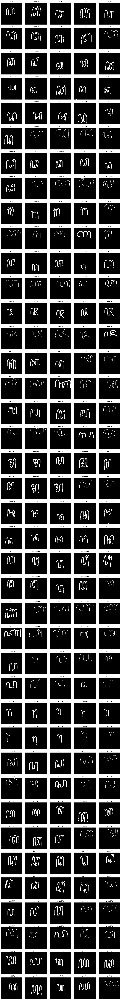

In [49]:
import matplotlib.pyplot as plt
import numpy as np

def display_images_per_class(images, labels, class_labels, num_per_class, num_cols=5):
    unique_labels = np.unique(labels)
    num_classes = len(unique_labels)
    
    # Calculate number of rows needed
    num_rows = (num_classes * num_per_class + num_cols - 1) // num_cols

    plt.figure(figsize=(num_cols * 3, num_rows * 3))  # Adjust figure size
    
    for i, label in enumerate(unique_labels):
        # Get indices of images for the current class
        class_indices = np.where(labels == label)[0]
        
        # Ensure there are enough images
        num_images = min(num_per_class, len(class_indices))
        
        for j in range(num_images):
            class_image = images[class_indices[j]]
            class_title = class_labels[label]
            
            plt.subplot(num_rows, num_cols, i * num_per_class + j + 1)
            plt.imshow(class_image, cmap='gray')
            plt.title(f"{class_title} ({label})", fontsize=15)  # Adjust fontsize if needed
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Assuming AKSARA contains the label names corresponding to each category index
class_labels = {i: aksara for i, aksara in enumerate(AKSARA)}

# Display 10 images per class with labels, keeping the number of columns fixed at 5
display_images_per_class(X_filtered, np.argmax(y_label, axis=1), class_labels, num_per_class=10, num_cols=5)

# Apply Gaussian Blur + Enhance the image sharpness + Apply sharpening filter + Remove noise using median filter + Otsu's thresholding + Invert the image 

In [50]:
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

# Define the input path and aksaraJowo
INPUT_PATH = path_main  
AKSARA = aksara_categories

# Define the target image size
IMAGE_SIZE = (96, 96)
INPUT_SHAPE = (96, 96, 1)

def create_image_generator(input_path, aksaraJowo, image_size):
    for index, jowo in enumerate(aksaraJowo):
        aksara_path = os.path.join(input_path, jowo)
        
        for filename in os.listdir(aksara_path):
            image_path = os.path.join(aksara_path, filename)
            original_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)  # Baca dan ubah warna asli
            original_image_resized = cv2.resize(original_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar asli
            grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Baca gambar sebagai grayscale
            grayscale_image_resized = cv2.resize(grayscale_image, image_size, interpolation=cv2.INTER_AREA)  # Resize gambar grayscale
            image_filtered = apply_custom_preprocessing(grayscale_image_resized)
            
            yield original_image_resized, grayscale_image_resized, image_filtered, index


def load_images(input_path, aksaraJowo, image_size):
    X_original, X_grayscale, X_filtered, y_label = [], [], [], []
    
    for original_image, grayscale_image, image_filtered, label in create_image_generator(input_path, aksaraJowo, image_size):
        X_original.append(original_image)
        X_grayscale.append(grayscale_image)
        X_filtered.append(image_filtered)
        y_label.append(label)
        
    X_original = np.array(X_original)
    X_grayscale = np.array(X_grayscale)
    X_filtered = np.array(X_filtered)
    y_label = to_categorical(np.array(y_label))
    
    return X_original, X_grayscale, X_filtered, y_label

def apply_custom_preprocessing(image):
    # Apply Gaussian Blur
    ApplyGaussian = cv2.GaussianBlur(image, (15, 15), 0.1)
    # Enhance the image sharpness
    img = cv2.addWeighted(image, 1.5, ApplyGaussian, -0.5, 0, image)
    # Apply sharpening filter
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    img = cv2.filter2D(img, -1, kernel)
    # Remove noise using median filter
    img = cv2.medianBlur(img, 1)
    # Apply Otsu's thresholding
    _, img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert the image (background to black, text to white)
    img = 255 - img
    
    return img

# Load images with custom preprocessing applied
X_original, X_grayscale, X_filtered, y_label = load_images(INPUT_PATH, AKSARA, IMAGE_SIZE)

In [51]:
import matplotlib.pyplot as plt
import numpy as np

def display_images_per_class(images, labels, class_labels, num_per_class, num_cols=5):
    unique_labels = np.unique(labels)
    num_classes = len(unique_labels)
    
    # Calculate number of rows needed
    num_rows = (num_classes * num_per_class + num_cols - 1) // num_cols

    plt.figure(figsize=(num_cols * 3, num_rows * 3))  # Adjust figure size
    
    for i, label in enumerate(unique_labels):
        # Get indices of images for the current class
        class_indices = np.where(labels == label)[0]
        
        # Ensure there are enough images
        num_images = min(num_per_class, len(class_indices))
        
        for j in range(num_images):
            class_image = images[class_indices[j]]
            class_title = class_labels[label]
            
            plt.subplot(num_rows, num_cols, i * num_per_class + j + 1)
            plt.imshow(class_image, cmap='gray')
            plt.title(f"{class_title} ({label})", fontsize=15)  # Adjust fontsize if needed
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Assuming AKSARA contains the label names corresponding to each category index
class_labels = {i: aksara for i, aksara in enumerate(AKSARA)}

# Display 10 images per class with labels, keeping the number of columns fixed at 5
display_images_per_class(X_filtered, np.argmax(y_label, axis=1), class_labels, num_per_class=50, num_cols=5)

In [ ]:
# # Select one image to display
# index_to_display = 100

# # Display the original image, grayscale image, and filtered image
# original_image = X_original[index_to_display]
# grayscale_image = X_grayscale[index_to_display]
# filtered_image = X_filtered[index_to_display]

# # Plot the images
# plt.figure(figsize=(15, 5))
# plt.subplot(1, 3, 1)
# plt.title('Original Image')
# plt.imshow(original_image)
# plt.axis('on')

# plt.subplot(1, 3, 2)
# plt.title('Grayscale Image')
# plt.imshow(grayscale_image)
# plt.axis('on')

# plt.subplot(1, 3, 3)
# plt.title('Filtered Image')
# # plt.imshow(filtered_image, cmap='gray')
# plt.imshow(filtered_image, cmap='gray')
# plt.axis('on')

# plt.show()